## Edit

* edited the sky-subtraction from 1-2; 2-1; 3-2; 4-3; 5-4 to 1-2; 2-1; 3-5; 4-3; 5-3.

In [2]:
from datetime import datetime as dt
dt.now()

datetime.datetime(2017, 6, 30, 15, 35, 36, 306957)

In [3]:
import os
os.environ['CONDA_DEFAULT_ENV']

'iraf27'

## skysubtraction (next dither)

In [4]:
import glob
import getpass
import os
try:
    from astropy.io import fits as pf
except:
    import pyfits as pf
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

nframes = 4
wpangle=4
ndither=5

ch1 = glob.glob('../*fg_ch1.fits')
ch1.sort()
ch2 = glob.glob('../*fg_ch2.fits')
ch2.sort()

In [5]:
len(ch1)

80

In [6]:
len(ch2)

80

## Check sky-subtracted frames

Sky subtraction was done as follows:
* dither 1 - dither 2
* dither 2 - dither 1
* dither 3 - dither 2
* dither 4 - dither 3
* dither 5 - dither 4

In [7]:
skysub_ch1 = glob.glob('*fgs_ch1.fits')
skysub_ch1.sort()
skysub_ch2 = glob.glob('*fgs_ch2.fits')
skysub_ch2.sort()

len(skysub_ch1)

80

## 4 waveplate rotation sets

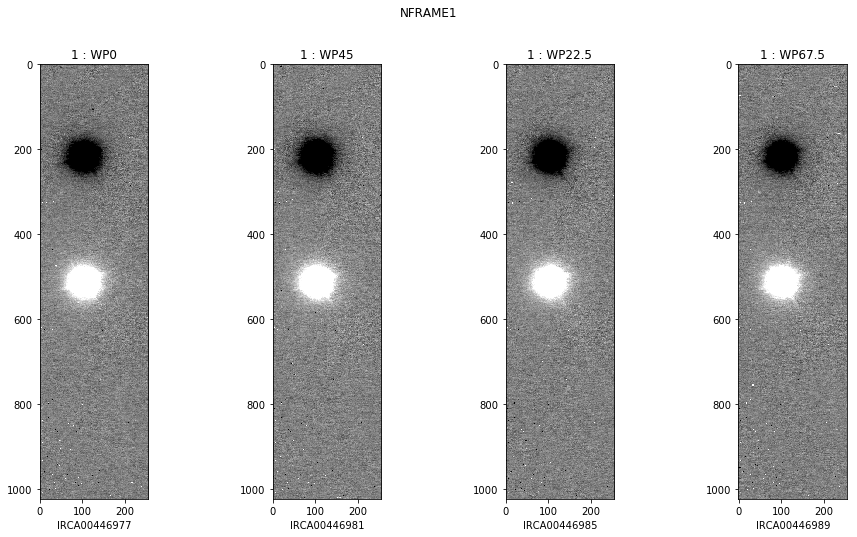

In [8]:
from astropy.visualization import ZScaleInterval
interval= ZScaleInterval()

fig, ax = plt.subplots(nrows=1, ncols=wpangle, figsize=(16,8))

for idx, i in enumerate(skysub_ch1[:wpangle*nframes][::wpangle]):
    hdr = pf.getheader(i)
    img = pf.getdata(i)
    vmin, vmax = interval.get_limits(img)
    ax[idx].imshow(img, vmin=vmin, vmax=vmax, cmap='gray')
    plt.suptitle('NFRAME1')
    if isinstance(hdr['I_DTHPOS'], str): 
        ax[idx].set_title(hdr['I_DTHPOS'])
        ax[idx].set_xlabel(hdr['FRAMEID'])
    else:
        pass

## all 4 nframes

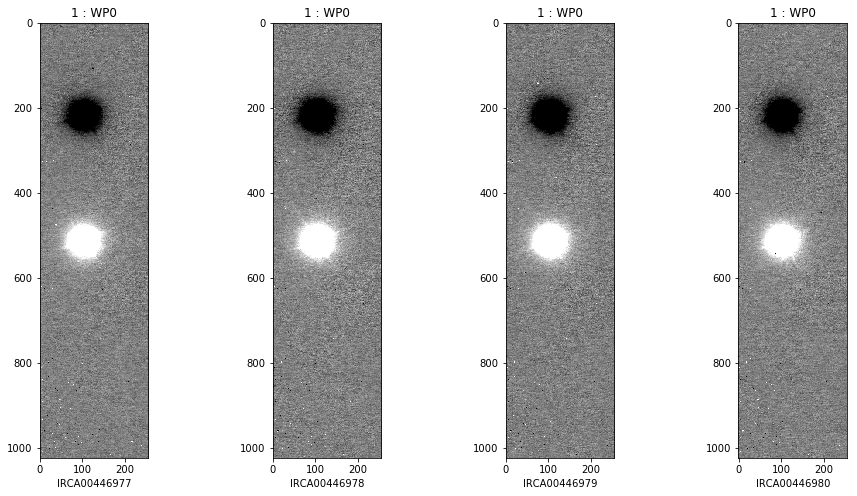

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(16,8))
for idx,i in enumerate(skysub_ch1[:4]):
    img = pf.getdata(i)
    hdr = pf.getheader(i)
    vmin, vmax = interval.get_limits(img)
    ax[idx].imshow(img, vmin=vmin, vmax=vmax, cmap='gray')
    ax[idx].set_title(hdr['I_DTHPOS'])
    ax[idx].set_xlabel(hdr['FRAMEID'])

## all 5 dithers

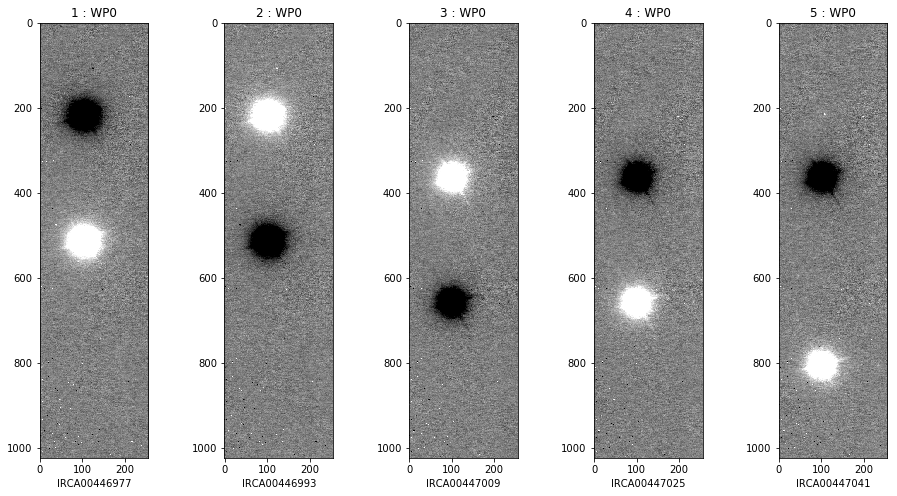

In [10]:
fig, ax = plt.subplots(nrows=1, ncols=ndither, figsize=(16,8))
for idx,i in enumerate(skysub_ch1[::wpangle*nframes][:ndither]):
    img = pf.getdata(i)
    hdr = pf.getheader(i)
    vmin, vmax = interval.get_limits(img)
    ax[idx].imshow(img, vmin=vmin, vmax=vmax, cmap='gray')
    ax[idx].set_title(hdr['I_DTHPOS'])
    ax[idx].set_xlabel(hdr['FRAMEID'])

## separate per 4 nframes: I1 to I4

In [11]:
for m,i in enumerate(skysub_ch1[::nframes]):
    hdr1 = pf.getheader(i)
    print('{0}, {1}'.format(m, hdr1['I_DTHPOS']))

0, 1 : WP0
1, 1 : WP45
2, 1 : WP22.5
3, 1 : WP67.5
4, 2 : WP0
5, 2 : WP45
6, 2 : WP22.5
7, 2 : WP67.5
8, 3 : WP0
9, 3 : WP45
10, 3 : WP22.5
11, 3 : WP67.5
12, 4 : WP0
13, 4 : WP45
14, 4 : WP22.5
15, 4 : WP67.5
16, 5 : WP0
17, 5 : WP45
18, 5 : WP22.5
19, 5 : WP67.5


In [12]:
from scipy.ndimage.interpolation import shift

#I.keys()
#split I into each nframe: 12 I image each dict
I1_shifted = {}
I2_shifted = {}
I3_shifted = {}
I4_shifted = {}

#nframe1
for m,i in enumerate(range(len(skysub_ch1))[::nframes]):
    hdr1 = pf.getheader(skysub_ch1[i])
    #print(hdr1['I_DTHPOS'])
    #ch1
    img1 = pf.getdata(skysub_ch1[i])
    #shift
    img1_shifted = shift(img1, shift=(0,8.2), mode='wrap')
    #ch2
    img2 = pf.getdata(skysub_ch2[i])
    I1_shifted[m] = (img1_shifted + img2)/2.

#nframe2
for n,i in enumerate(range(len(skysub_ch1))[::nframes]):
    hdr1 = pf.getheader(skysub_ch1[i+1])
    img1 = pf.getdata(skysub_ch1[i+1])
    img1_shifted = shift(img1, shift=(0,8.2), mode='wrap')
    #ch2
    img2 = pf.getdata(skysub_ch2[i+1])
    I2_shifted[n] = (img1_shifted + img2)/2.
    
#nframe3
for o,i in enumerate(range(len(skysub_ch1))[::nframes]):
    hdr1 = pf.getheader(skysub_ch1[i+2])
    img1 = pf.getdata(skysub_ch1[i+2])
    img1_shifted = shift(img1, shift=(0,8.2), mode='wrap')
    #ch2
    img2 = pf.getdata(skysub_ch2[i+2])
    I3_shifted[o] = (img1_shifted + img2)/2.

#nframe4
for p,i in enumerate(range(len(skysub_ch1))[::nframes]):
    hdr1 = pf.getheader(skysub_ch1[i+3])
    img1 = pf.getdata(skysub_ch1[i+3])
    img1_shifted = shift(img1, shift=(0,8.2), mode='wrap')
    #ch2
    img2 = pf.getdata(skysub_ch2[i+3])
    I4_shifted[p] = (img1_shifted + img2)/2.

I1_shifted.keys()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

## test realignment by checking Q image

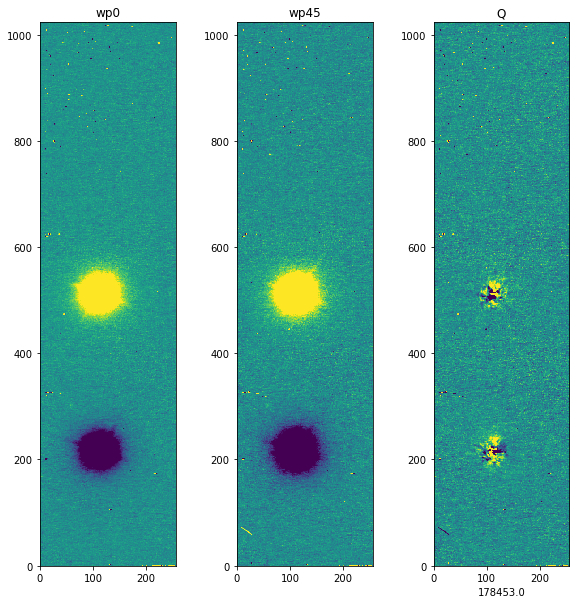

In [13]:
#note that wp0 and wp45 indices

fig,ax = plt.subplots(1,3,figsize=(10,10))
vmin1,vmax1=interval.get_limits(I1_shifted[0])
ax[0].imshow(I1_shifted[0],vmin=vmin,vmax=vmax, origin='lower')
ax[0].set_title('wp0')

vmin2,vmax2=interval.get_limits(I1_shifted[1])
ax[1].imshow(I1_shifted[1],vmin=vmin2,vmax=vmax2, origin='lower')
ax[1].set_title('wp45')

diff=I1_shifted[0]-I1_shifted[1]
vmin3,vmax3=interval.get_limits(diff)
ax[2].imshow(diff,vmin=vmin3,vmax=vmax3, origin='lower')
ax[2].set_title('Q')
ax[2].set_xlabel(np.linalg.norm(diff, ord=2))

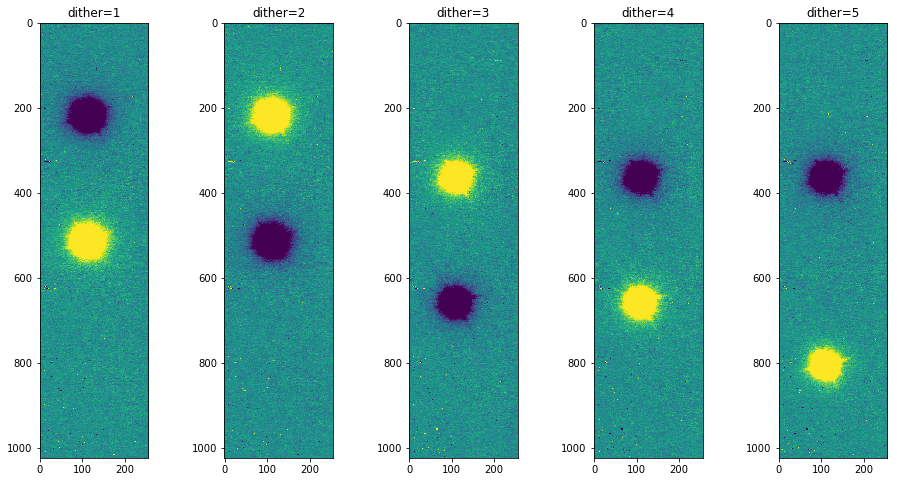

In [21]:
fig, ax = plt.subplots(nrows=1, ncols=ndither, figsize=(16,8))
for idx,key in enumerate(I1_shifted.keys()[::wpangle]):
    vmin, vmax = interval.get_limits(I1_shifted[key])
    ax[idx].imshow(I1_shifted[key], vmin=vmin, vmax=vmax)
    ax[idx].set_title('dither={}'.format(idx+1))

In [22]:
range(1,5)

[1, 2, 3, 4]

## Guess ycentroid and check if ch1 & ch2 coincide

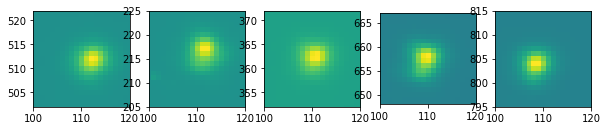

In [23]:
fig, ax = plt.subplots(1,5,figsize=(10,10))

#dither 1 to 5
xest = (100,120)
yest = [(502,522), (205,225), (352,372), (648,667), (795,815)]

#nframe 1
for i,j in enumerate(I1_shifted.keys()[::wpangle]): #only first set
    ax[i].imshow(I1_shifted[j])
    ax[i].set_xlim(xest)
    ax[i].set_ylim(yest[i])

In [15]:
!pwd

/home/jp/data/imaging/ircs_UH30B/b_EPIC203843911/crop/skysub


sum every first four image (=one WP cycle) in each I1, I2, I3 (i.e. nframe 1,2,3) to get Itot per dither.

(100, 120)

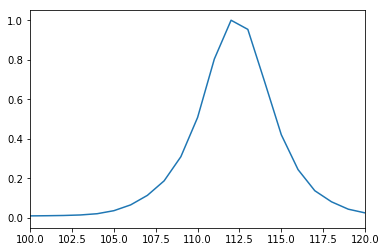

In [24]:
xslice=512
plt.plot(I1_shifted[0][xslice,:]/np.max(I1_shifted[0][xslice,:]))
plt.xlim(100,120)

In [25]:
fwhm_estimate=10
sigma=fwhm_estimate / (2*np.sqrt(2*np.log(2)))
sigma

4.2466090014400955

## centroid computation

In [26]:
convolve=True

from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
from scipy.ndimage.filters import gaussian_filter

def get_centroid(img, num_stars=1, fwhm=10.0):
    mean, median, std = sigma_clipped_stats(img, sigma=3.0, iters=5)
    daofind = DAOStarFinder(fwhm=fwhm, threshold=5.*std)
    if convolve==True:
        #apply median filter to remove hot pixels
        img = gaussian_filter(img, sigma=sigma, mode='nearest')#,cval=0
    sources = daofind(img - median)
    #get index of brightest source
    idx = [i for i,j in enumerate(sources['peak']) if j == max(sources['peak'])]
    #get peak
    x_max, y_max = float(sources['xcentroid'][idx].data), float(sources['ycentroid'][idx].data)
    
    return (x_max, y_max)

In [27]:
from tqdm import tqdm

centroidsI1,centroidsI2,centroidsI3,centroidsI4 =[],[],[],[]

for key in tqdm(I1_shifted.keys()):
    centroidsI1.append(get_centroid(I1_shifted[key]))
for key in tqdm(I2_shifted.keys()):
    centroidsI3.append(get_centroid(I2_shifted[key]))
for key in tqdm(I3_shifted.keys()):
    centroidsI2.append(get_centroid(I3_shifted[key]))
for key in tqdm(I4_shifted.keys()):
    centroidsI4.append(get_centroid(I4_shifted[key]))
    
centroidsI1

100%|██████████| 20/20 [00:06<00:00,  3.05it/s]


[(112.15988935833546, 511.59384024060387),
 (111.99305235914694, 511.3888094016803),
 (111.62997573198909, 511.27834715477235),
 (111.43822033460506, 511.2656175576148),
 (111.51346004680822, 216.37079926667747),
 (111.31467261964326, 216.4082631268114),
 (111.38233314880108, 216.1182672449238),
 (111.06109849740139, 216.03115885802328),
 (110.44346390074413, 362.18474789058797),
 (110.28840329393938, 362.1041236065685),
 (110.07817920012981, 362.00582080691754),
 (109.96928664378704, 361.9362886757224),
 (109.18255378387272, 657.0874730583184),
 (108.9019315031931, 656.8907376366609),
 (108.65051779824624, 656.7782723139162),
 (108.28895936231717, 656.6913855027205),
 (108.34516354689707, 803.7364800303861),
 (107.94719590328276, 803.7391304301377),
 (107.56763935864713, 803.6620315910042),
 (107.48239326111097, 803.5580849333155)]

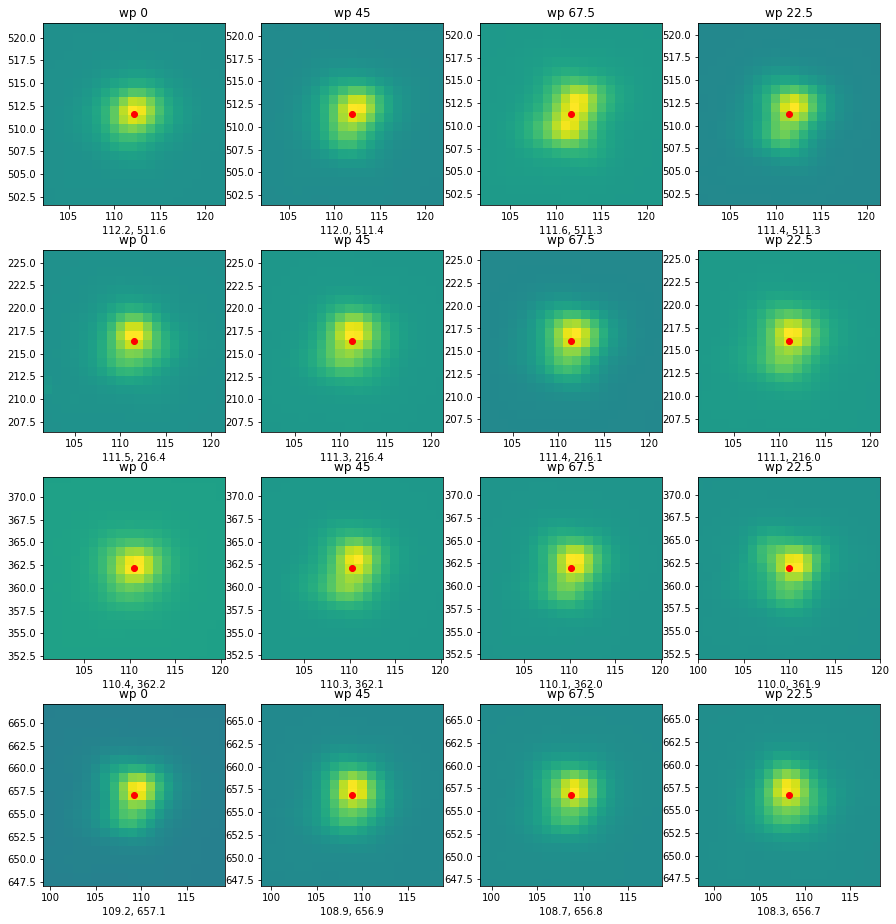

In [28]:
fig = plt.figure(figsize=(15,16))

dither_x = [row[0] for row in centroidsI1]
dither_y = [row[1] for row in centroidsI1]

n=10
#nframe 1
for i,j in enumerate(I1_shifted.keys()[:wpangle*nframes]):
    ax = plt.subplot(4,4,i+1)
    #vmin, vmax = interval.get_limits(I1[j])
    ax.imshow(I1_shifted[j])#,vmin=vmin,vmax=vmax)
    ax.set_xlim([dither_x[i]-n,dither_x[i]+n])
    ax.set_ylim([dither_y[i]-n,dither_y[i]+n])
    ax.plot(dither_x[i],dither_y[i],'ro', linewidth='10')
    ax.set_title('wp {}'.format([0,45,67.5,22.5][i%4]))
    ax.set_xlabel('{0:.1f}, {1:.1f}'.format(dither_x[i],dither_y[i]))
    #ax.axis('tight')

## centroid time series

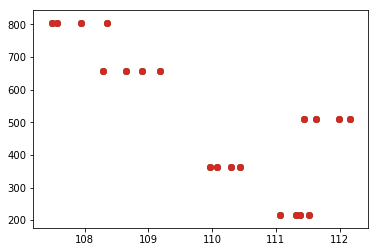

In [29]:
for i in [centroidsI1,centroidsI2,centroidsI3,centroidsI4]:
    dither_x = [row[0] for row in centroidsI1]
    dither_y = [row[1] for row in centroidsI1]
    plt.scatter(dither_x,dither_y)

## shift and crop

In [55]:
def get_crop(image, centroid, box_size):
    '''
    simple cropping tool
    '''
    x, y = centroid
    image_crop = np.copy(image[int(y-(box_size/2)):int(y+(box_size/2)),int(x-(box_size/2)):int(x+(box_size/2))])
    return image_crop

In [72]:

#I was already shifted above before combining ch1 and ch2 into I,
#but I'll stick with I1_shifted after cropping image in all nframes

for key in I1_shifted.keys():
    #instead of shifting, crop at centroid
    I1_shifted[key] = get_crop(I1_shifted[key], centroidsI1[key], box_size=200)

for key in I2_shifted.keys():
    #instead of shifting, crop at centroid
    I2_shifted[key] = get_crop(I2_shifted[key], centroidsI2[key], box_size=200)

for key in I3_shifted.keys():
    #instead of shifting, crop at centroid
    I3_shifted[key] = get_crop(I3_shifted[key], centroidsI3[key], box_size=200)
    
for key in I4_shifted.keys():
    #instead of shifting, crop at centroid
    I4_shifted[key] = get_crop(I4_shifted[key], centroidsI4[key], box_size=200)

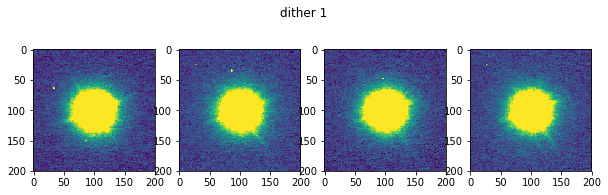

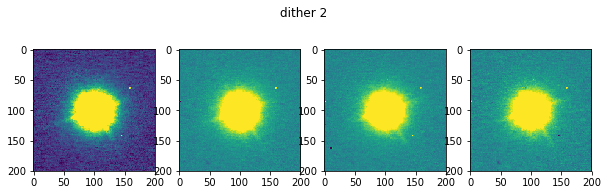

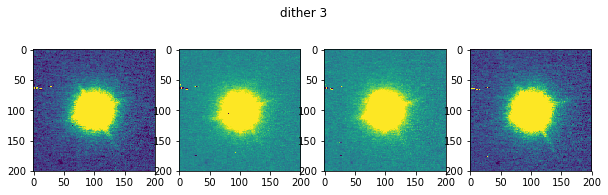

In [59]:
fig, ax = plt.subplots(1,4,figsize=(10,3))
#nframe 1
#dither 1
for i,key in enumerate(list(I1_shifted.keys()[:4])): #only first set
    vmin, vmax = interval.get_limits(I1_shifted[key])
    fig.suptitle('dither 1')
    ax[i].imshow(I1_shifted[key], vmin=vmin, vmax=vmax)

fig, ax = plt.subplots(1,4,figsize=(10,3))
#dither 2
for i,key in enumerate(list(I1_shifted.keys()[4:8])): #only first set
    fig.suptitle('dither 2')
    vmin, vmax = interval.get_limits(I1_shifted[key])
    ax[i].imshow(I1_shifted[key], vmin=vmin, vmax=vmax)
    
fig, ax = plt.subplots(1,4,figsize=(10,3))
#dither 3
for i,key in enumerate(list(I1_shifted.keys()[8:12])): #only first set
    vmin, vmax = interval.get_limits(I1_shifted[key])
    fig.suptitle('dither 3')
    ax[i].imshow(I1_shifted[key], vmin=vmin, vmax=vmax)

## Combine aligned I image (I_shifted) per WP cycle: Itot

In [74]:
Itot1={} #nframe1 with 5 dithered images
Itot2={}
Itot3={}
Itot4={}

#nframe 1: dither 1 to 5
for i,j in enumerate(I1_shifted.keys()[::4]):
    Itot1[i]=[]
    Itot1[i].append(I1_shifted[j])
    print(i,j)
    Itot1[i].append(I1_shifted[j+1])
    print(i,j+1)
    Itot1[i].append(I1_shifted[j+2])
    print(i,j+2)
    Itot1[i].append(I1_shifted[j+3])
    print(i,j+3)
    
#nframe 2: dither 1 to 5
for i,j in enumerate(I2_shifted.keys()[::4]): 
    Itot2[i]=[]
    Itot2[i].append(I2_shifted[j])
    Itot2[i].append(I2_shifted[j+1])
    Itot2[i].append(I2_shifted[j+2])
    Itot2[i].append(I2_shifted[j+3])
    
#nframe 3: dither 1 to 5
for i,j in enumerate(I3_shifted.keys()[::4]):
    Itot3[i]=[]
    Itot3[i].append(I3_shifted[j])
    Itot3[i].append(I3_shifted[j+1])
    Itot3[i].append(I3_shifted[j+2])
    Itot3[i].append(I3_shifted[j+3])
    
#nframe 3: dither 1 to 5
for i,j in enumerate(I4_shifted.keys()[::4]):
    Itot4[i]=[]
    Itot4[i].append(I4_shifted[j])
    Itot4[i].append(I4_shifted[j+1])
    Itot4[i].append(I4_shifted[j+2])
    Itot4[i].append(I4_shifted[j+3])

(0, 0)
(0, 1)
(0, 2)
(0, 3)
(1, 4)
(1, 5)
(1, 6)
(1, 7)
(2, 8)
(2, 9)
(2, 10)
(2, 11)
(3, 12)
(3, 13)
(3, 14)
(3, 15)
(4, 16)
(4, 17)
(4, 18)
(4, 19)


In [75]:
np.array(Itot1[0]).shape

(4, 200, 200)

In [76]:
for i in Itot1.keys():
    Itot1[i]=np.median(Itot1[i],axis=0)
    Itot2[i]=np.median(Itot2[i],axis=0)
    Itot3[i]=np.median(Itot3[i],axis=0)
    Itot4[i]=np.median(Itot4[i],axis=0)

after stacking,

In [77]:
np.array(Itot1[0]).shape

(200, 200)

In [78]:
Itot4.keys()

[0, 1, 2, 3, 4]

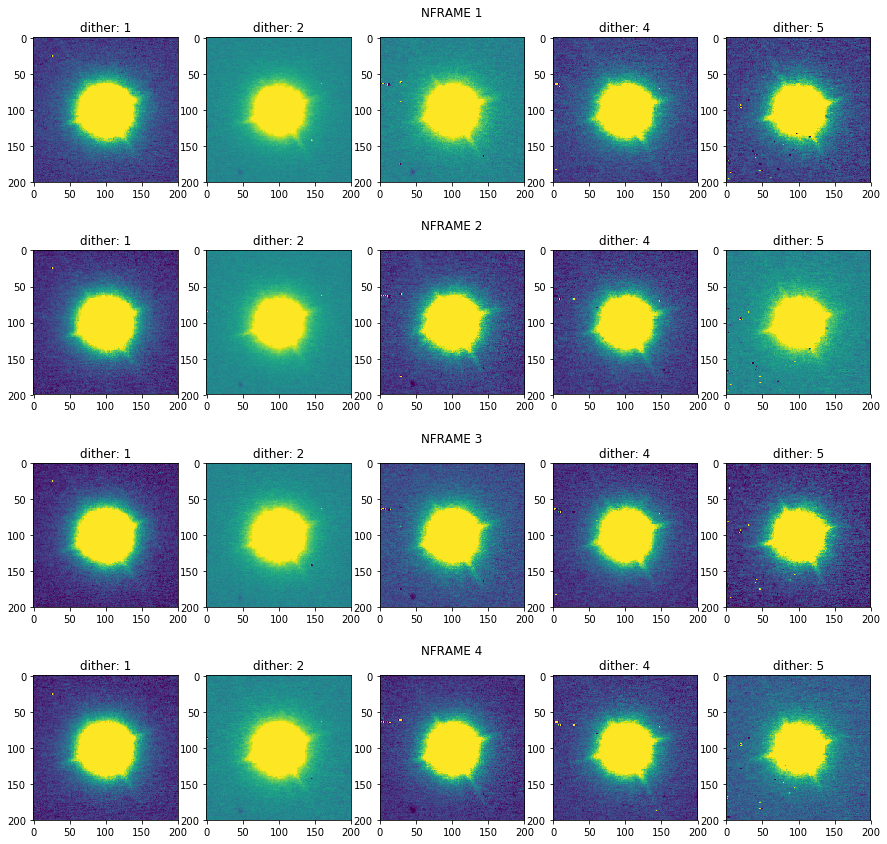

In [79]:
fig, ax = plt.subplots(nrows=nframes, ncols=5, figsize=(15,15))

for n,key in enumerate(Itot1.keys()):
    vmin1, vmax1 = interval.get_limits(Itot1[key])
    vmin2, vmax2 = interval.get_limits(Itot2[key])
    vmin3, vmax3 = interval.get_limits(Itot3[key])
    vmin4, vmax4 = interval.get_limits(Itot4[key])
    
    #Itot1: nframe1
    ax[0,n].imshow(Itot1[key], vmin=vmin1, vmax=vmax1)#, cmap='gray')
    ax[0,n].set_title('dither: {}'.format(n+1))
    #Itot2: nframe2
    ax[1,n].imshow(Itot2[key], vmin=vmin2, vmax=vmax2)#, cmap='gray')
    ax[1,n].set_title('dither: {}'.format(n+1))
    #Itot3 nframe3
    ax[2,n].imshow(Itot3[key], vmin=vmin3, vmax=vmax3)#, cmap='gray')
    ax[2,n].set_title('dither: {}'.format(n+1))
    #Itot3 nframe4
    ax[3,n].imshow(Itot4[key], vmin=vmin4, vmax=vmax4)#, cmap='gray')
    ax[3,n].set_title('dither: {}'.format(n+1))
    
ax[0,2].set_title("NFRAME 1\n")
ax[1,2].set_title("NFRAME 2\n")
ax[2,2].set_title("NFRAME 3\n")
ax[3,2].set_title("NFRAME 4\n")

proper subplotting [here](https://stackoverflow.com/questions/27426668/row-titles-for-matplotlib-subplot)

As seen above, consecutive frames must be subtracted to get Q and U. The 20 I images per nframe will be split into 5 Q and 5 U images.

In [81]:
Q1 = {}
Q2 = {}
Q3 = {}
Q4 = {}
U1 = {}
U2 = {}
U3 = {}
U4 = {}

#nframe 1
for h,i in enumerate(range(len(I1_shifted))[::4]):
    #5 Q images each nframe
    print(i,i+1)
    Q1[h]=I1_shifted[i]-I1_shifted[i+1]
    #5 U images each nframe
    print(i+2,i+3)
    U1[h]=I1_shifted[i+2]-I1_shifted[i+3]
    
#nframe 2
for h,j in enumerate(range(len(I2_shifted))[::4]):
    Q2[h]=I2_shifted[j]-I2_shifted[j+1]
    U2[h]=I2_shifted[j+2]-I2_shifted[j+3]
    
#nframe 3
for h,k in enumerate(range(len(I3_shifted))[::4]):
    Q3[h]=I3_shifted[k]-I3_shifted[k+1]
    U3[h]=I3_shifted[k+2]-I3_shifted[k+3]
    
#nframe 3
for f,l in enumerate(range(len(I4_shifted))[::4]):
    Q4[f]=I4_shifted[l]-I4_shifted[l+1]
    U4[f]=I4_shifted[l+2]-I4_shifted[l+3]
    

(0, 1)
(2, 3)
(4, 5)
(6, 7)
(8, 9)
(10, 11)
(12, 13)
(14, 15)
(16, 17)
(18, 19)


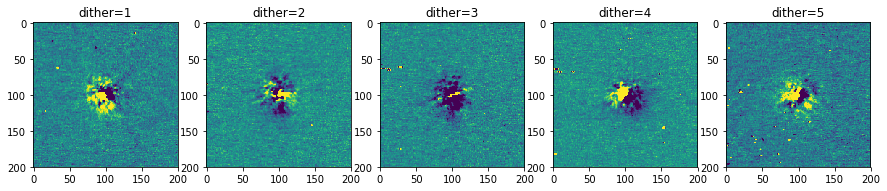

In [88]:
fig, ax = plt.subplots(1,5,figsize=(15,10))

#nframe 1
for i,j in enumerate(Q1.keys()): #only first set
    vmin,vmax=interval.get_limits(Q1[j])
    ax[i].imshow(Q1[j],vmin=vmin,vmax=vmax)
    ax[i].set_title('dither={}'.format(i+1))

shift o image (left) to the right by 8 pixels like what was done in realigning I images

## realigning Q and U

In [89]:
from scipy.ndimage.interpolation import shift
import image_registration as im_reg

Q1_shifted = {}
Q2_shifted = {}
Q3_shifted = {}
Q4_shifted = {}
U1_shifted = {}
U2_shifted = {}
U3_shifted = {}
U4_shifted = {}

for h,i in enumerate(range(len(I1_shifted))[::4]):
    #5 Q images each nframe
    print(i,i+1)
    wp0=I1_shifted[i]
    wp45=I1_shifted[i+1]
    dy, dx = im_reg.cross_correlation_shifts(wp0, wp45, maxoff=4, return_error=False, zeromean=True)
    print('dy={0:.2f}, dx={1:.2f}'.format(dy, dx))
    #aligned_ch3 = np.roll(np.roll(im3,int(yoff),1),int(xoff),0) #shift based on calculated centroid
    Q1_shifted[h] = wp0 - shift(wp45, shift=(dy, dx))
    
for h,i in enumerate(range(len(I1_shifted))[::4]):
    #5 Q images each nframe
    print(i,i+1)
    wp225=I1_shifted[i+2]
    wp675=I1_shifted[i+3]
    dy, dx = im_reg.cross_correlation_shifts(wp225, wp675, maxoff=4, return_error=False, zeromean=True)
    print('dy={0:.2f}, dx={1:.2f}'.format(dy, dx))
    #aligned_ch3 = np.roll(np.roll(im3,int(yoff),1),int(xoff),0) #shift based on calculated centroid
    U1_shifted[h] = wp225 - shift(wp675, shift=(dy, dx))

    
    
print('---DONE---')

(0, 1)
dy=0.98, dx=-0.11
(4, 5)
dy=-0.16, dx=0.14
(8, 9)
dy=-0.08, dx=0.18
(12, 13)
dy=0.67, dx=0.87
(16, 17)
dy=0.62, dx=0.07
(0, 1)
dy=-0.23, dx=0.01
(4, 5)
dy=-0.32, dx=0.02
(8, 9)
dy=1.02, dx=0.83
(12, 13)
dy=-0.53, dx=-0.04
(16, 17)
dy=-0.02, dx=-0.01
---DONE---


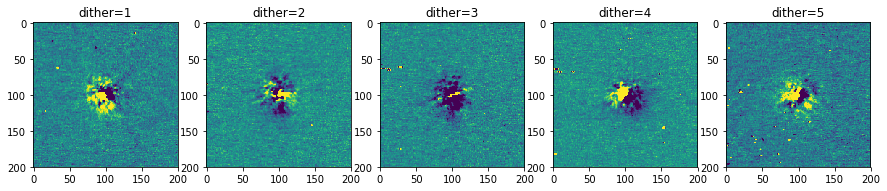

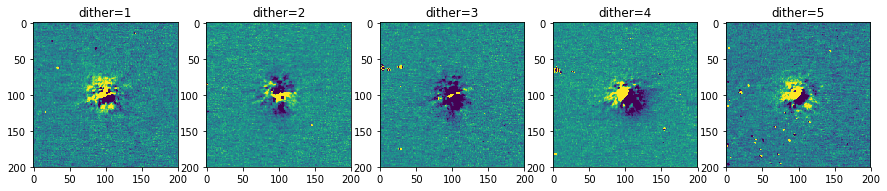

In [93]:
fig, ax = plt.subplots(1,5,figsize=(15,10))

#nframe 1
for i,j in enumerate(Q1.keys()): #only first set
    vmin,vmax=interval.get_limits(Q1[j])
    ax[i].imshow(Q1[j],vmin=vmin,vmax=vmax)
    ax[i].set_title('dither={}'.format(i+1))
    
fig, ax = plt.subplots(1,5,figsize=(15,10))

#nframe 1
for i,j in enumerate(Q1_shifted.keys()): #only first set
    vmin,vmax=interval.get_limits(Q1[j])
    ax[i].imshow(Q1_shifted[j],vmin=vmin,vmax=vmax)
    ax[i].set_title('dither={}'.format(i+1))

### random shifting to produce smallest residuals

In [99]:
from numpy.linalg import norm

def minimize_residual_std(img1, img2):
    residuals = {}
    diff = {}
    dx=dy=np.arange(-3,3,0.5)
    for i in dx:
        for j in dy:
            img2_shifted = shift(img2, shift=(j, i))
            diff[str(i)+','+str(j)] = img1 - img2_shifted
            residuals[str(i)+','+str(j)] = norm(img1 - img2_shifted, ord=2) #np.abs() does not work; np.std()
    #get smallest flux
    min_flux = np.min([residuals[k] for k in residuals.keys()])
    #get indices of shifts with minimum flux (dy,dx)
    idx = [k for k in residuals.keys() if residuals[k] == min_flux]
    #get image with smallest residual
    img = diff[idx[0]]
    return (img, idx[0].split(',')) #dict of images


#wp0 and wp45
img1=I1_shifted[0]
img2=I1_shifted[1]

(img, shift_xy) = minimize_residual_std(img1, img2)

In [106]:
Q1_shifted = {}
Q2_shifted = {}
U1_shifted = {}
U2_shifted = {}

#nframe1
for h,i in enumerate(range(len(I1_shifted))[::4]):
    #5 Q images each nframe
    print(i,i+1) #wp0 and wp45
    wp0=I1_shifted[i]
    wp45=I1_shifted[i+1]
    (Qimg, Qshift_xy) = minimize_residual_std(wp0, wp45)
    print('dx,dy={}'.format(Qshift_xy))
    Q1_shifted[h]= Qimg
    #shift to make U
    print(i+2,i+3) #wp225 and wp675
    wp225=I1_shifted[i+2]
    wp675=I1_shifted[i+3]
    '''
    #U must be shifted independently from Q
    dx, dy = shift_xy[0], shift_xy[1]
    wp675_shifted = shift(wp675, shift=(int(dy), int(dx)))
    U1_shifted[h]= wp225 - wp675_shifted '''
    (Uimg, Ushift_xy) = minimize_residual_std(wp225, wp675)
    print('dx,dy={}'.format(Ushift_xy))
    U1_shifted[h]= Uimg

#nframe2
for h,i in tqdm(enumerate(range(len(I2_shifted))[::4])):
    #print(i,i+1)
    wp0=I2_shifted[i]
    wp45=I2_shifted[i+1]
    (Qimg, Qshift_xy) = minimize_residual_std(wp0, wp45)
    #print('dx,dy={}'.format(Qshift_xy))
    Q2_shifted[h]= Qimg
    #shift to make U
    #print(i+2,i+3)
    wp225=I2_shifted[i+2]
    wp675=I2_shifted[i+3]
    (Uimg, Ushift_xy) = minimize_residual_std(wp225, wp675)
    #print('dx,dy={}'.format(Ushift_xy))
    U2_shifted[h]= Uimg
    
#nframe2
for h,i in tqdm(enumerate(range(len(I3_shifted))[::4])):
    #print(i,i+1)
    wp0=I3_shifted[i]
    wp45=I3_shifted[i+1]
    (Qimg, Qshift_xy) = minimize_residual_std(wp0, wp45)
    #print('dx,dy={}'.format(Qshift_xy))
    Q3_shifted[h]= Qimg
    #shift to make U
    #print(i+2,i+3)
    wp225=I3_shifted[i+2]
    wp675=I3_shifted[i+3]
    (Uimg, Ushift_xy) = minimize_residual_std(wp225, wp675)
    #print('dx,dy={}'.format(Ushift_xy))
    U3_shifted[h]= Uimg
    
#nframe2
for h,i in tqdm(enumerate(range(len(I4_shifted))[::4])):
    #print(i,i+1)
    wp0=I4_shifted[i]
    wp45=I4_shifted[i+1]
    (Qimg, Qshift_xy) = minimize_residual_std(wp0, wp45)
    #print('dx,dy={}'.format(Qshift_xy))
    Q4_shifted[h]= Qimg
    #shift to make U
    #print(i+2,i+3)
    wp225=I4_shifted[i+2]
    wp675=I4_shifted[i+3]
    (Uimg, Ushift_xy) = minimize_residual_std(wp225, wp675)
    #print('dx,dy={}'.format(Ushift_xy))
    U4_shifted[h]= Uimg
    
print('---DONE---')

(0, 1)
dx,dy=['-1.0', '0.0']
(2, 3)
dx,dy=['0.0', '0.0']
(4, 5)
dx,dy=['0.0', '0.0']
(6, 7)
dx,dy=['0.5', '0.0']
(8, 9)
dx,dy=['0.5', '-0.5']
(10, 11)
dx,dy=['-1.0', '-1.0']
(12, 13)
dx,dy=['-0.5', '-1.0']
(14, 15)
dx,dy=['0.5', '0.0']
(16, 17)
dx,dy=['-0.5', '0.0']
(18, 19)


0it [00:00, ?it/s]

dx,dy=['0.0', '0.0']


5it [00:14,  2.97s/it]
5it [00:15,  3.08s/it]
5it [00:15,  3.06s/it]

---DONE---


In [102]:
len(U1_shifted)

5

In [103]:
Q1_shifted.keys()

[0, 1, 2, 3, 4]

In [104]:
Q2_shifted.keys()

[0, 1, 2, 3, 4]

In [110]:
PI1={}
PI2={}
PI3={}
PI4={}

for i,q in enumerate(Q1.keys()):
    #5 PI image each nframe
    PI1[i]=np.sqrt(Q1_shifted[q]**2+U1_shifted[q]**2)
    PI2[i]=np.sqrt(Q2_shifted[q]**2+U2_shifted[q]**2)
    PI3[i]=np.sqrt(Q3_shifted[q]**2+U3_shifted[q]**2)
    PI4[i]=np.sqrt(Q4_shifted[q]**2+U4_shifted[q]**2)

In [111]:
len(PI1)

5

## Q

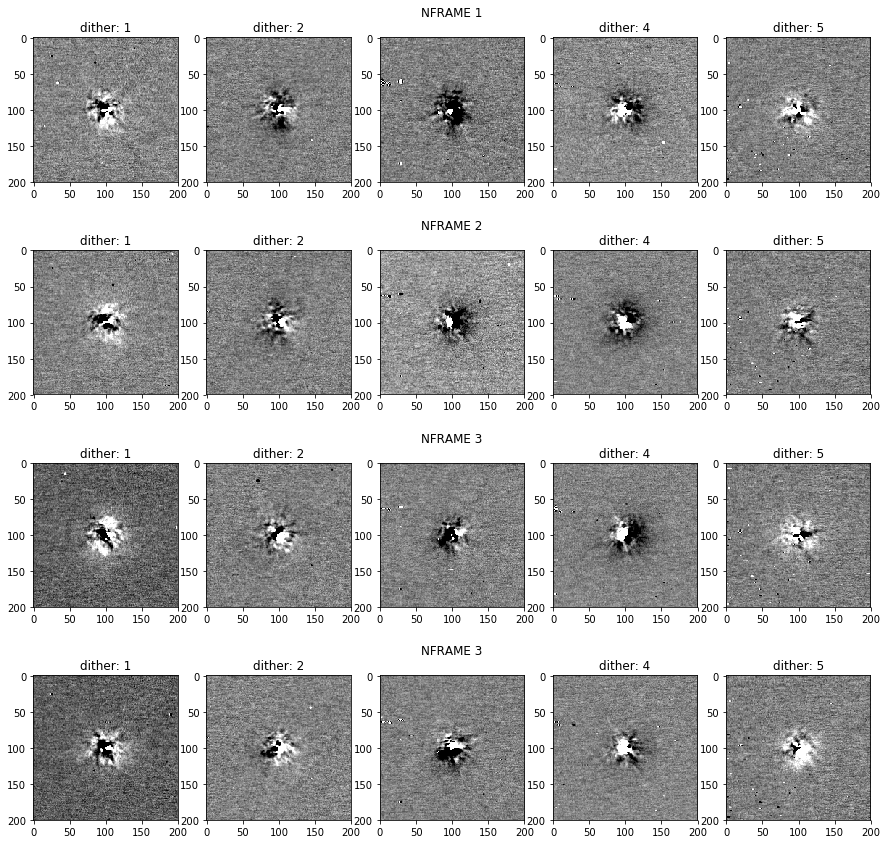

In [114]:
fig, ax = plt.subplots(nrows=nframes, ncols=ndither, figsize=(15,15))

for n,key in enumerate(Q1_shifted.keys()):
    vmin1, vmax1 = interval.get_limits(Q1_shifted[key])
    vmin2, vmax2 = interval.get_limits(Q2_shifted[key])
    vmin3, vmax3 = interval.get_limits(Q3_shifted[key])
    vmin4, vmax4 = interval.get_limits(Q3_shifted[key])
    
    #Q1: nframe1
    ax[0,n].imshow(Q1_shifted[key], vmin=vmin1, vmax=vmax1, cmap='gray')
    ax[0,n].set_title('dither: {}'.format(n+1))
    #Q2: nframe2
    ax[1,n].imshow(Q2_shifted[key], vmin=vmin2, vmax=vmax2, cmap='gray')
    ax[1,n].set_title('dither: {}'.format(n+1))
    #Q3 nframe3
    ax[2,n].imshow(Q3_shifted[key], vmin=vmin3, vmax=vmax3, cmap='gray')
    ax[2,n].set_title('dither: {}'.format(n+1))
    #Q4 nframe3
    ax[3,n].imshow(Q4_shifted[key], vmin=vmin4, vmax=vmax4, cmap='gray')
    ax[3,n].set_title('dither: {}'.format(n+1))
    
ax[0,2].set_title("NFRAME 1\n")
ax[1,2].set_title("NFRAME 2\n")
ax[2,2].set_title("NFRAME 3\n")
ax[3,2].set_title("NFRAME 4\n")

## U

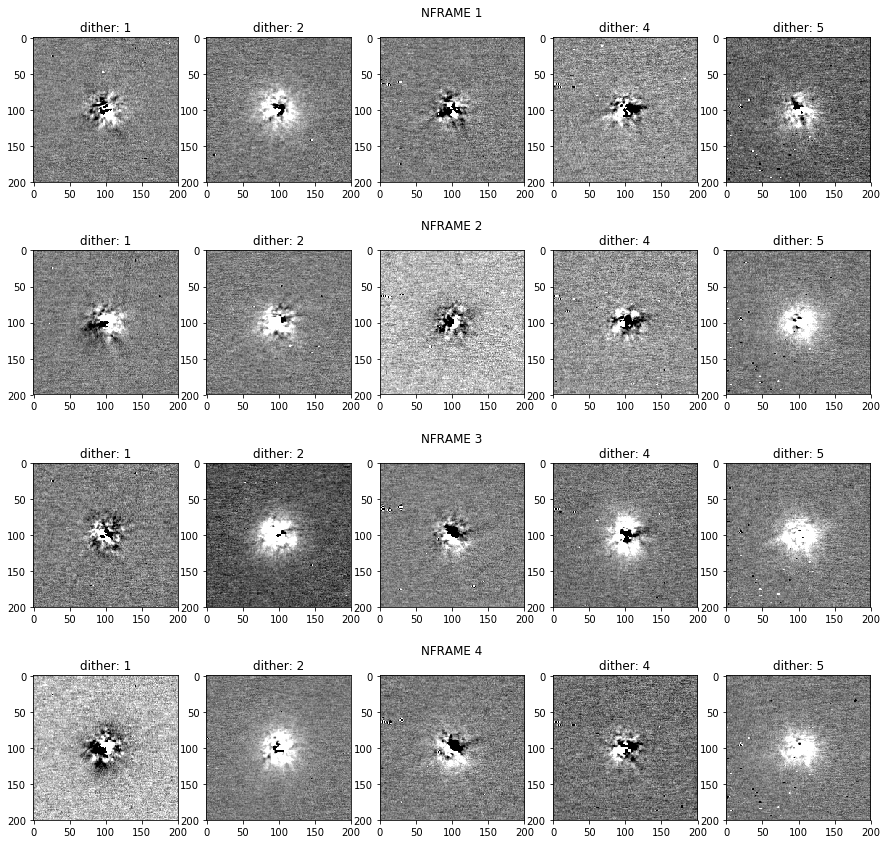

In [115]:
fig, ax = plt.subplots(nrows=nframes, ncols=ndither, figsize=(15,15))

for n,key in enumerate(U1_shifted.keys()):
    vmin1, vmax1 = interval.get_limits(U1_shifted[key])
    vmin2, vmax2 = interval.get_limits(U2_shifted[key])
    vmin3, vmax3 = interval.get_limits(U3_shifted[key])
    vmin4, vmax4 = interval.get_limits(U4_shifted[key])
    
    #Q1: nframe1
    ax[0,n].imshow(U1_shifted[key], vmin=vmin1, vmax=vmax1, cmap='gray')
    ax[0,n].set_title('dither: {}'.format(n+1))
    #Q2: nframe2
    ax[1,n].imshow(U2_shifted[key], vmin=vmin2, vmax=vmax2, cmap='gray')
    ax[1,n].set_title('dither: {}'.format(n+1))
    #Q3 nframe3
    ax[2,n].imshow(U3_shifted[key], vmin=vmin3, vmax=vmax3, cmap='gray')
    ax[2,n].set_title('dither: {}'.format(n+1))
    #U4 nframe4
    ax[3,n].imshow(U4_shifted[key], vmin=vmin4, vmax=vmax4, cmap='gray')
    ax[3,n].set_title('dither: {}'.format(n+1))
    
ax[0,2].set_title("NFRAME 1\n")
ax[1,2].set_title("NFRAME 2\n")
ax[2,2].set_title("NFRAME 3\n")
ax[3,2].set_title("NFRAME 4\n")

## Selective stacking

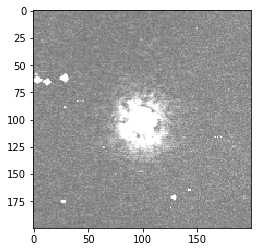

In [118]:
U_med_few=np.median([PI3[2],PI4[2]],axis=0)
plt.imshow(U_med_few,vmin=vmin,vmax=vmax, cmap='gray')

## PI

In [119]:
PI3.keys()

[0, 1, 2, 3, 4]

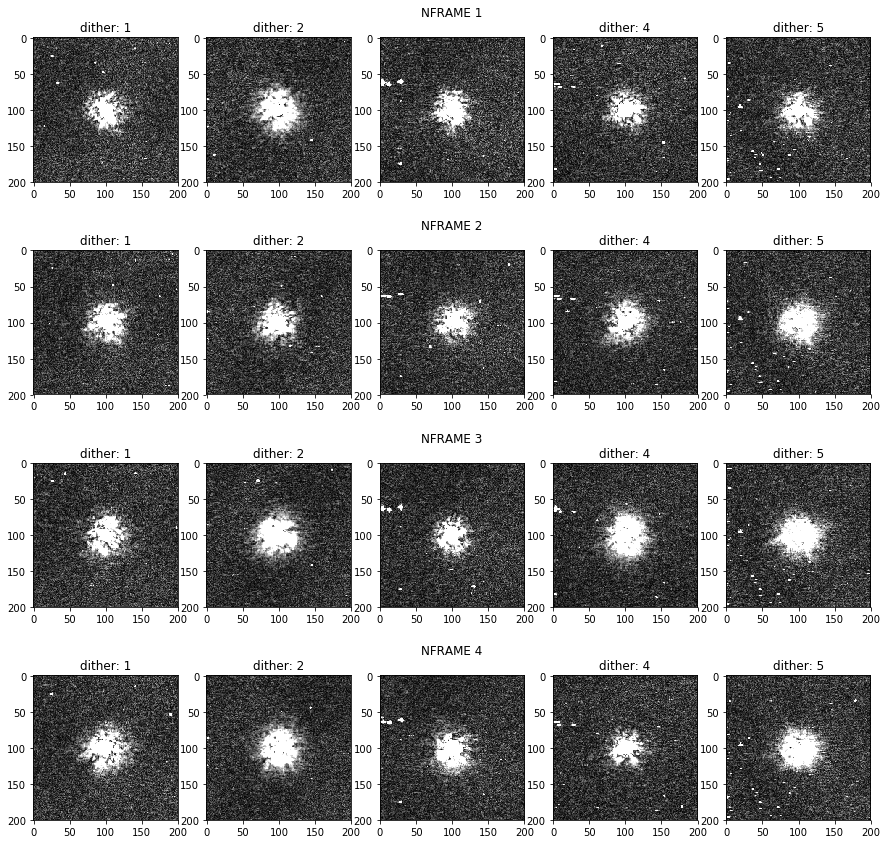

In [120]:
fig, ax = plt.subplots(nrows=nframes, ncols=ndither, figsize=(15,15))

for i in range(5):
    vmin1, vmax1 = interval.get_limits(PI1[i])
    vmin2, vmax2 = interval.get_limits(PI2[i])
    vmin3, vmax3 = interval.get_limits(PI3[i])
    vmin4, vmax4 = interval.get_limits(PI4[i])
    
    ax[0,i].imshow(PI1[i], vmin=vmin1, vmax=vmax1, cmap='gray')
    ax[0,i].set_title('dither: {}'.format(i+1))
    ax[1,i].imshow(PI2[i], vmin=vmin2, vmax=vmax2, cmap='gray')
    ax[1,i].set_title('dither: {}'.format(i+1))
    ax[2,i].imshow(PI3[i], vmin=vmin3, vmax=vmax3, cmap='gray')
    ax[2,i].set_title('dither: {}'.format(i+1))
    ax[3,i].imshow(PI4[i], vmin=vmin4, vmax=vmax4, cmap='gray')
    ax[3,i].set_title('dither: {}'.format(i+1))
    
ax[0,2].set_title("NFRAME 1\n")
ax[1,2].set_title("NFRAME 2\n")
ax[2,2].set_title("NFRAME 3\n")
ax[3,2].set_title("NFRAME 4\n")

## median combined I, Q, U, PI (per dither)

In [121]:
Itot_med = {}
for n,key in enumerate(Itot1.keys()):
    Itot_med[n] = []
    #dither 1
    Itot_med[n].append(Itot1[key])
    Itot_med[n].append(Itot2[key])
    Itot_med[n].append(Itot3[key])
    Itot_med[n].append(Itot4[key])
    #stack
    Itot_med[n]=np.median(Itot_med[n],axis=0)

Q_med = {}
for n,key in enumerate(Q1_shifted.keys()):
    Q_med[n] = []
    #dither 1
    Q_med[n].append(Q1_shifted[key])
    Q_med[n].append(Q2_shifted[key])
    Q_med[n].append(Q3_shifted[key])
    Q_med[n].append(Q4_shifted[key])
    #stack
    Q_med[n]=np.median(Q_med[n],axis=0)
    
U_med = {}
for n,key in enumerate(U1_shifted.keys()):
    U_med[n] = []
    #dither 1
    U_med[n].append(U1_shifted[key])
    U_med[n].append(U2_shifted[key])
    U_med[n].append(U3_shifted[key])
    U_med[n].append(U4_shifted[key])
    #stack
    U_med[n]=np.median(U_med[n],axis=0)
    
PI_med = {}
for n,key in enumerate(PI1.keys()):
    PI_med[n] = []
    #dither 1
    PI_med[n].append(PI1[key])
    PI_med[n].append(PI2[key])
    PI_med[n].append(PI3[key])
    PI_med[n].append(PI4[key])
    #stack
    PI_med[n]=np.median(PI_med[n],axis=0)

## Stacked I, Q,U, & PI per dither

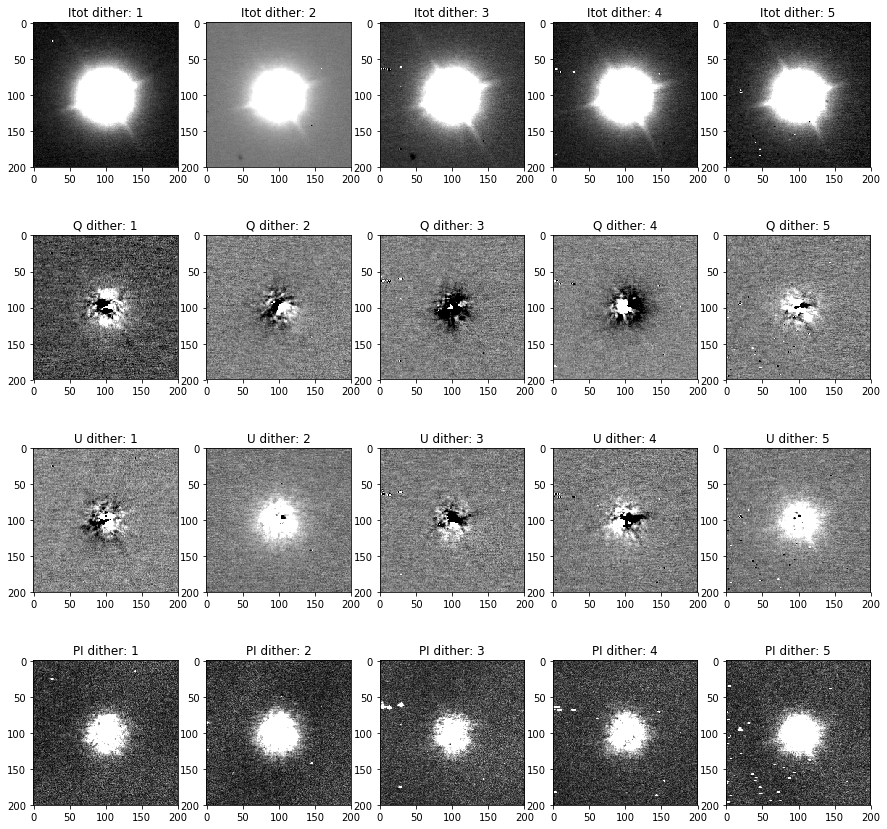

In [122]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(15,15))

for i in range(5):
    vmin0, vmax0 = interval.get_limits(Itot_med[i])
    vmin1, vmax1 = interval.get_limits(Q_med[i])
    vmin2, vmax2 = interval.get_limits(U_med[i])
    vmin3, vmax3 = interval.get_limits(PI_med[i])
    
    ax[0,i].imshow(Itot_med[i], vmin=vmin0, vmax=vmax0, cmap='gray')
    ax[0,i].set_title('Itot dither: {}'.format(i+1))
    ax[1,i].imshow(Q_med[i], vmin=vmin1, vmax=vmax1, cmap='gray')
    ax[1,i].set_title('Q dither: {}'.format(i+1))
    ax[2,i].imshow(U_med[i], vmin=vmin2, vmax=vmax2, cmap='gray')
    ax[2,i].set_title('U dither: {}'.format(i+1))
    ax[3,i].imshow(PI_med[i], vmin=vmin3, vmax=vmax3, cmap='gray')
    ax[3,i].set_title('PI dither: {}'.format(i+1))

## Combine dithered PI

In [123]:
Itot_med_final = []
Q_med_final = []
U_med_final = []
PI_med_final = []

for i in range(ndither):
    #combine per dither
    Itot_med_final.append(Itot_med[i])
    Q_med_final.append(Q_med[i])
    U_med_final.append(U_med[i])
    PI_med_final.append(PI_med[i])

Itot_med_final = np.median(Itot_med_final, axis=0)
Q_med_final = np.median(Q_med_final, axis=0)
U_med_final = np.median(U_med_final, axis=0)
PI_med_final = np.median(PI_med_final, axis=0)

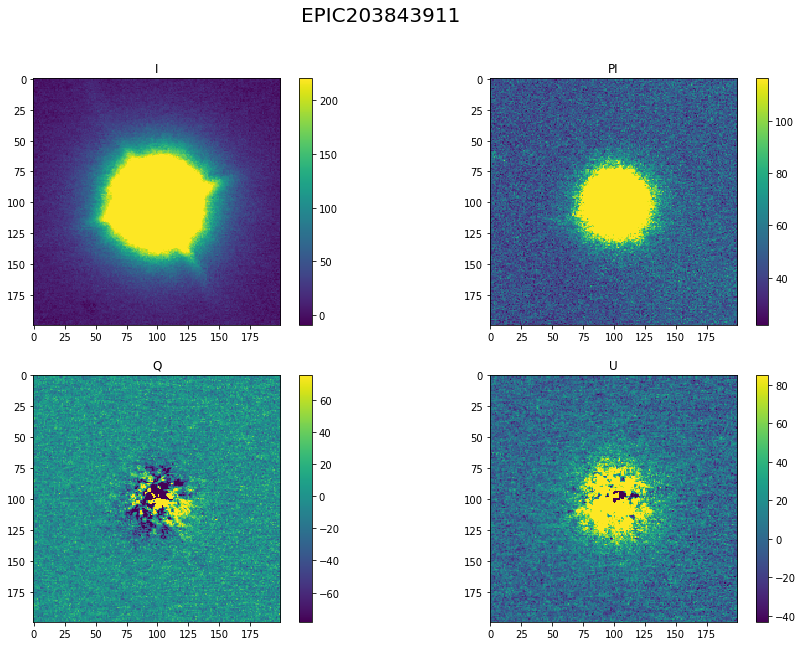

In [124]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15,10))

vmin0, vmax0 = interval.get_limits(Itot_med_final)
vmin1, vmax1 = interval.get_limits(PI_med_final)
#vmin1, vmax1 = interval.get_limits(PI_crop/I_crop)
vmin2, vmax2 = interval.get_limits(Q_med_final)
vmin3, vmax3 = interval.get_limits(U_med_final)

ax1 = ax[0,0].imshow(Itot_med_final, vmin=vmin0, vmax=vmax0)
ax[0,0].set_title('I')
fig.colorbar(ax1, ax=ax[0,0])#, orientation='horizontal')
#ax2 = ax[0,1].imshow(PI_crop/I_crop, vmin=vmin1, vmax=vmax1)
ax2 = ax[0,1].imshow(PI_med_final, vmin=vmin1, vmax=vmax1)
fig.colorbar(ax2, ax=ax[0,1])
#ax[0,1].set_title('PI/I')
ax[0,1].set_title('PI')
ax3 = ax[1,0].imshow(Q_med_final, vmin=vmin2, vmax=vmax2)
fig.colorbar(ax3, ax=ax[1,0])
ax[1,0].set_title('Q')
ax4 = ax[1,1].imshow(U_med_final, vmin=vmin3, vmax=vmax3)
fig.colorbar(ax4, ax=ax[1,1])
ax[1,1].set_title('U')
plt.suptitle(pf.getheader(skysub_ch1[0])['OBJECT'], fontsize=20)
#plt.tight_layout()
# ax[0,0].imshow(np.log(I_crop))
# ax[0,1].imshow(np.log(PI_crop))
# ax[1,0].imshow(np.log(Q_crop))
# ax[1,1].imshow(np.log(U_crop))

## shifted I_med

## Shifted Q_med

## Shifted U_med

apparent misalignment of Q and U per dither is seen

## shifting and stacking PI

## estimating FWHM

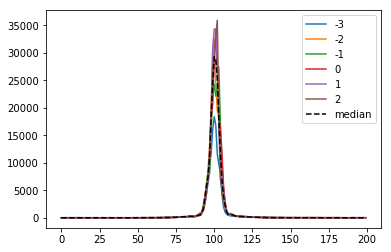

In [125]:
xslices=[]
for i in np.arange(-3,3,1):
    xslice=PI_med_final[PI_med_final.shape[1]/2+i,:]
    plt.plot(xslice, label=i)
    xslices.append(xslice)

xslice=np.median(xslices,axis=0)
plt.plot(xslice, 'k--', label='median')
plt.legend()

A: 524.764860114
mu: 100.482228234
sigma= -2.72214502472
eps: 2.34846158926
est_fwhm= 6.41065153323


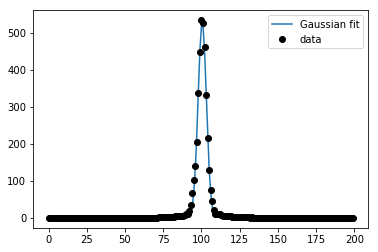

In [126]:
#using scipy
from scipy.optimize import curve_fit

def gauss(x, *params):
    A, mu, sigma, eps= params
    return A*np.exp(-(x-mu)**2/(2.*sigma**2)) + eps

#normalized
ydata = xslice/np.median(xslice)
xdata = np.array(range(len(ydata)))
xmean = len(xdata)/2
sigma = np.std(ydata)
#fitting
eps =0
popt, pcov = curve_fit(gauss, xdata, ydata, p0 = [1, xmean, sigma, eps])

plt.plot(xdata,gauss(xdata, *popt), label='Gaussian fit')
plt.plot(xdata,ydata,'ok', label='data')
plt.legend()

est_fwhm=2.355*np.abs(popt[2])
print('A: {}\nmu: {}\nsigma= {}\neps: {}\nest_fwhm= {}'.format(popt[0],popt[1], popt[2], popt[3], est_fwhm))


## Polarization vectors

In [127]:
'''
pol vector class
'''

from scipy.ndimage.filters import gaussian_filter
from numpy import *
import matplotlib.pyplot as pl

max_length=10       # Pol=100 % in pixel

### Classes and Modules ###
class Linear_pol_vector:
    def __init__(self,x,y,I,Q,U,ax,max_length=10,linewidth=2,color='b'):
        self.x=x
        self.y=y
        self.I=I
        self.Q=Q
        self.U=U
        self.ax=ax
        self.max_length=max_length
        self.P=sqrt(Q**2+U**2)/I
        if self.P == 0:
            self.pl,=ax.plot([self.x,self.x],[self.y,self.y],linestyle='-',color=color,
                       linewidth=2)
        else:
            self.ang=arctan2(self.U,self.Q)*0.5
            dx=self.P*cos(self.ang)*0.5*self.max_length
            dy=self.P*sin(self.ang)*0.5*self.max_length
            self.pl,=ax.plot([self.x-dx,self.x+dx],[self.y-dy,self.y+dy], linestyle='-',color=color,linewidth=2)
    def change_max_length(self,max_length=10):
        if self.P != 0:
            dx=self.P*cos(self.ang)*0.5*self.max_length
            dy=self.P*sin(self.ang)*0.5*self.max_length
            self.pl.set_xdata=[self.x-dx,self.x+dx]
            self.pl.set_ydata=[self.y-dy,self.y+dy]
    def reset(self):
        self.change_max_length()
        self.pl.set_linewidth=2
        self.pl.set_color='w'

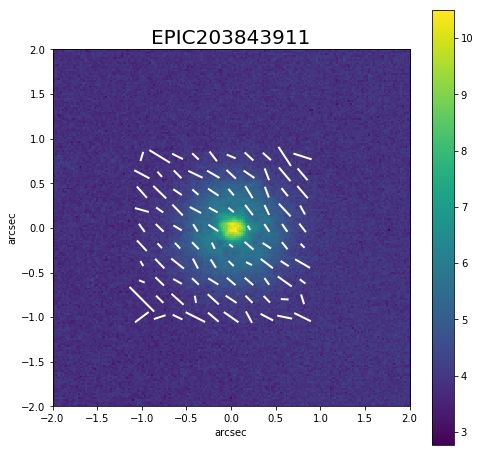

In [128]:
scale= 0.020 #ircs_pix_size: mas/pix
box_size = 200

#xcenter = int(sources['xcentroid'][2])
#ycenter = int(sources['ycentroid'][2])
xcenter = ycenter = box_size/2.0

#convert to AU by multiplying arsec with parsec
#x_in_AU=(np.arange(box_size)-xcenter)*scale*distance
#y_in_AU=(np.arange(box_size)-ycenter)*scale*distance

x_in_as=(np.arange(box_size)-xcenter)*scale
y_in_as=(np.arange(box_size)-ycenter)*scale

img_PI = PI_med_final
img_Q = Q_med_final
img_U = U_med_final
img_I = Itot_med_final



#shift reference w.r.t. the target coordinate
fig, ax = plt.subplots(1,1, figsize=(8,8))
a = 0-xcenter
b = box_size - xcenter
c = 0 -ycenter
d =  box_size - ycenter
extent_PI=np.array([a,b,c,d])*scale


#------------------PLOT image---------------------#
#normalize with I?
data = img_PI#/img_I
#vmin,vmax= interval.get_limits(data)
plt.imshow(np.log(data),extent=extent_PI)#, vmin=vmin,vmax=vmax)
plt.colorbar()

#------------------PLOT vectors---------------------#
#average of pol signal 
#varray=[]
dx=dy=1
area=(2*dx+1)*(2*dy+1)

#extent of the region where pol vectors will be drawn
dn = 50 #pix
xmin=xcenter-dn 
xmax=xcenter+dn
ymin=ycenter-dn
ymax=ycenter+dn
inc=10
for x in np.arange(xmin,xmax,inc):
    for y in np.arange(ymin,ymax,inc):
        x,y=int(x), int(y)
        if np.log(data[y,x]) < 9.0: #threshold of polarization (smaller is wider)
            I=sum(img_I[y-dy:y+dy+1,x-dx:x+dx+1])/area
            Q=sum(img_Q[y-dy:y+dy+1,x-dx:x+dx+1])/area
            U=sum(img_U[y-dy:y+dy+1,x-dx:x+dx+1])/area
            v=Linear_pol_vector(x_in_as[x],y_in_as[y],I,-Q,-U,ax,max_length=1,color='w')
#savefig('obj_PI_conva_sigma05_pol.fits',v???)
plt.draw()
#arcsec
plt.xlim([-2,2])
plt.ylim([-2,2])
plt.xlabel('arcsec')
plt.ylabel('arcsec')
plt.title(pf.getheader(skysub_ch1[0])['OBJECT'], fontsize=20)
plt.show()